In [4]:
## == Now run this in Python:

import numpy as np
import matplotlib
from matplotlib import rcParams
import matplotlib.pyplot as pl
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt


sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=100, color_map='viridis')  # low dpi (dots per inch) yields small inline figures
sc.logging.print_header()
sc.settings.figdir ='./figures/graph_abstraction/'


scanpy==1.7.1 anndata==0.7.4 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.2.2 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 leidenalg==0.8.3


In [6]:
##======  Read adata object ======##

adata = sc.read("C:/Users/Mai-Linh Ton/Desktop/adata_highres.h5ad")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


# Add spatially resolved clusters

In [12]:
cell_id = ['Late Erythrocytes' if row['leiden_2'] in ['0']
           else 'Brain/Neural Tube' if row['leiden_2'] in ['1']
           else 'Somitic Mesoderm' if row['leiden_2'] in ['2']
           else 'Posterior Mesoderm' if row['leiden_2'] in ['3']
           else 'Limb Ectoderm' if row['leiden_2'] in ['4']
           else 'Anterior Mesoderm' if row['leiden_2'] in ['5']
           else 'Trophoblast' if row['leiden_2'] in ['6']
           else 'Epiblast' if row['leiden_2'] in ['7']
           else 'CYT' if row['leiden_2'] in ['8']
           else 'YS Mesothelium' if row['leiden_2'] in ['9']
           else 'Endothelium' if row['leiden_2'] in ['10']
           else 'NMP' if row['leiden_2'] in ['11']
           else 'EXE mesoderm?' if row['leiden_2'] in ['12']
           else 'SCT' if row['leiden_2'] in ['13']
           else 'Visceral YS Endoderm' if row['leiden_2'] in ['14']
           else 'Cranial Mesoderm' if row['leiden_2'] in ['15']
           else 'Parietal YS Endoderm' if row['leiden_2'] in ['16']
           else 'Early Amniotic Ectoderm' if row['leiden_2'] in ['17']
           else 'Hypoblast' if row['leiden_2'] in ['18']
           else 'Late Amniotic Ectoderm' if row['leiden_2'] in ['19']
           else 'Allantois' if row['leiden_2'] in ['20']
           else 'Anterior Hypoblast' if row['leiden_2'] in ['21']
           else 'Neural Crest' if row['leiden_2'] in ['22']
           else 'Chorion' if row['leiden_2'] in ['23']
           else 'Megakaryocytes' if row['leiden_2'] in ['24']
           else 'Early Erythrocytes' if row['leiden_2'] in ['25']
           else 'Gut' if row['leiden_2'] in ['26']
           else 'Notochord' if row['leiden_2'] in ['27']
           else 'Cardiomyocytes' if row['leiden_2'] in ['28']
           else row['leiden_2'] for index, row in adata.obs.iterrows()]


In [13]:
adata.obs['cell_id'] = cell_id

In [14]:
cell_id_2 = ['Placodes' if row['leiden_3'] in ['9']
           else 'Floor Plate' if row['leiden_3'] in ['36']
           else 'Haematoendothelial progenitors' if row['leiden_3'] in ['28']
           else 'Primitive Streak' if row['leiden_3'] in ['29']
           else row['cell_id'] for index, row in adata.obs.iterrows()]

In [15]:
pd.Series(cell_id_2).value_counts()

Late Erythrocytes                 11010
Brain/Neural Tube                 10689
Somitic Mesoderm                   8927
Posterior Mesoderm                 8546
Anterior Mesoderm                  8099
Trophoblast                        7885
CYT                                6517
YS Mesothelium                     6337
Epiblast                           5831
Placodes                           5585
NMP                                5422
EXE mesoderm?                      4983
Endothelium                        4887
SCT                                4863
Visceral YS Endoderm               4513
Cranial Mesoderm                   4147
Parietal YS Endoderm               4138
Early Amniotic Ectoderm            3978
Hypoblast                          3923
Late Amniotic Ectoderm             3506
Allantois                          3250
Limb Ectoderm                      3030
Anterior Hypoblast                 2952
Neural Crest                       2273
Chorion                            2031


In [16]:
adata.obs['cell_id_2'] = cell_id_2

In [17]:
##====== Create colour palette for cell types ======##

all_colours = {
    
    "Allantois" : "#532C8A",
    "Early Amniotic Ectoderm" : "#b9a0a6",
    "Late Amniotic Ectoderm" : "#f6f6a8",
    "Anterior Mesoderm" : "#139992",
    "Brain/Neural Tube" : "#647a4f",
    "Cardiomyocytes" : "#B51D8D",
    "Chorion" : "#df7f81",
    "Cranial Mesoderm" : "#3f84aa",
    "Early Erythrocytes" : "#ef4e22",
    "Visceral YS Endoderm" : "#f6bfcb",
    "Parietal YS Endoderm" : "#d0e099",
    "Anterior Hypoblast" : "#a8a8a8",
    "Endothelium" : "#ff891c",
    "Epiblast" : "#635447",
    "CYT": "#7c746c",
    "SCT" : "#f7f79e",
    "Floor Plate" : "#16026e",
    "Gut" : "#ef5a9d",
    "Haematoendothelial progenitors" : "#fbbe92",
    "Hypoblast" : "#9b8a93",
    "Late Erythrocytes" : "#c72128",
    "Limb Ectoderm" : "#c6c691",
    "Megakaryocytes" : "#f79083",
    "YS Mesothelium" : "#c75818",
    "EXE mesoderm?" : "#cc7818",
    "Neural Crest" : "#c3c388",
    "NMP" : "#8ec792",
    "Notochord" : "#0f4a9c",   
    "Placodes" :"#65a83e",
    "Posterior Mesoderm" : "#8e78b0",
    "Primitive Streak" : "#FC8D59",
    "Somitic Mesoderm" : "#005579",
    "Trophoblast" : "#9d9d11"
}    

colPalette = [all_colours[i] for i in sorted(np.unique(adata.obs['cell_id_2']))]

C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'cell_id' as categorical
... storing 'cell_id_2' as categorical


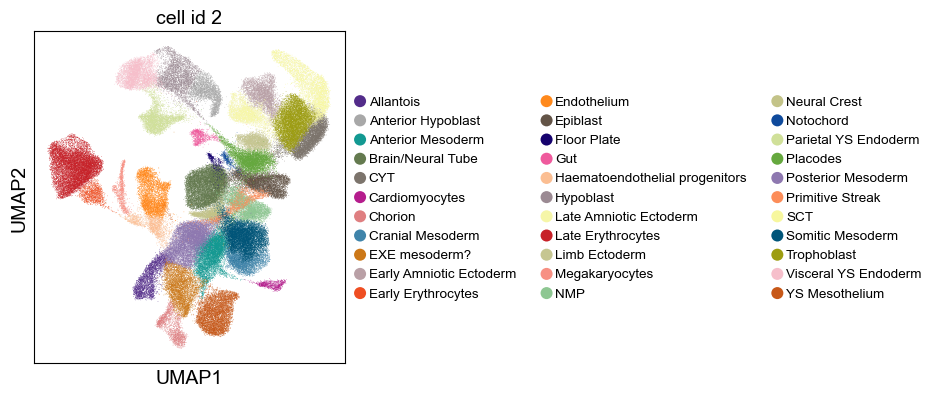

In [18]:
sc.pl.scatter(adata,color='cell_id_2',legend_loc='right margin',legend_fontweight='normal',legend_fontsize='x-small',basis="umap", palette=colPalette)

In [38]:
adata_endoderm = adata[adata.obs.cell_id_2.isin(['Placodes', 'Visceral YS Endoderm','Gut','Parietal YS Endoderm','Hypoblast','Anterior Hypoblast'])]
adata_ectoderm = adata[adata.obs.cell_id_2.isin(['SCT','CYT','Late Amniotic Ectoderm','Early Amniotic Ectoderm','Trophoblast'])]

C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [131]:
#sc.pp.scale(adata_endoderm)
#sc.pp.scale(adata_ectoderm)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [66]:
#create SNN graph
sc.pp.neighbors(adata_endoderm, n_neighbors=20, n_pcs=50)
 
#run UMAP
sc.tl.umap(adata_endoderm, min_dist=0.8)

#create SNN graph
#sc.pp.neighbors(adata_ectoderm, n_neighbors=20, n_pcs=50)
 
#run UMAP
#sc.tl.umap(adata_ectoderm, min_dist=0.8)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


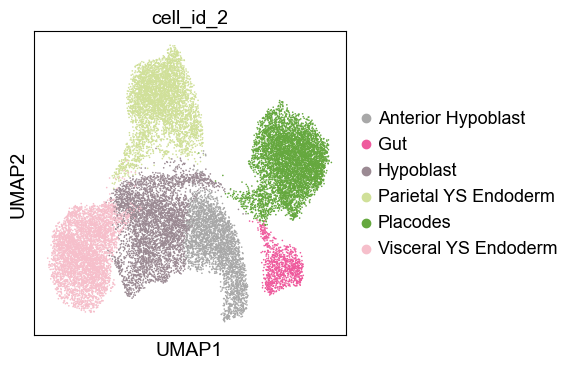

In [67]:
sc.pl.umap(adata_endoderm,color='cell_id_2',legend_loc='right margin')
#sc.pl.umap(adata_ectoderm,color='cell_id_2',legend_loc='right margin')

ranking genes
C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
C:\ProgramData\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:419: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:58)


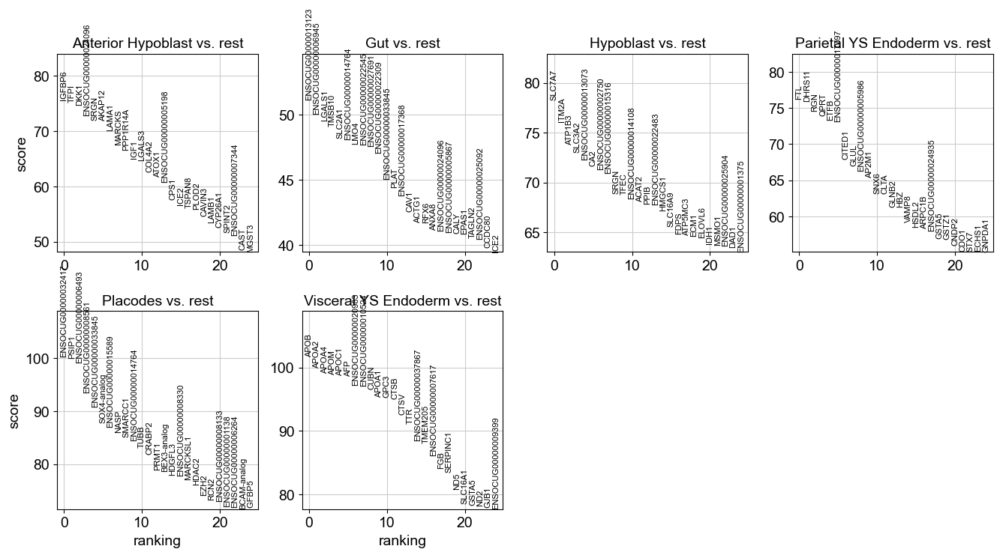

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,AHSP,SFRP2,TCF15,MSX1-analog,CLDN6,PEG3,FABP3,POU5F1,GATA3,ACTA2,...,WNT6,PEG10,CPS1,TFAP2B,ITGA4,TUBA4A,GLNB2,MISP3-analog,ENSOCUG00000008561,ACTC1
1,ALAS2,CRABP2,NR2F1-analog,HOXA9,EPCAM,MDK-analog,ENSOCUG00000009672,FABP7,SOD1,ENSOCUG00000008728,...,ENSOCUG00000009672,ENSOCUG00000026099,SRGN,SERPINE2,ANXA1,ENSOCUG00000013551,HBZ,EPAS1,IGFBP5,MYH7
2,ADA,DPYSL5,CRABP1,HAND2,BCAM-analog,ENSOCUG00000006493,ENSOCUG00000021273,CLDN6,NFE2L3,COL1A1,...,ICE2,COL1A2,TFPI,CRABP1,COL3A1,GNG11,ENSOCUG00000022291,ENSOCUG00000013123,FOXA2,ENSOCUG00000015634
3,HBZ,ENSOCUG00000008561,FOXC1-analog,BMP4,ENSOCUG00000030473,TPM1,ENSOCUG00000026023,ENSOCUG00000023626,ENSOCUG00000008071,LUM,...,ENSOCUG00000027691,WNT2,IGF1,CRABP2,COL1A1,MEF2C,ENSOCUG00000011998,LMO4,ELAVL4,MYL4
4,GLNB2,CRABP1,ENSOCUG00000006264,HOXA5,ENSOCUG00000025092,MEST,GATA3,ENSOCUG00000007501,ENSOCUG00000020955,ANXA1,...,ENSOCUG00000024096,COL11A1,DKK1,NR2F1-analog,DLK1,FERMT3-analog,ALAS2,ENSOCUG00000029429,FABP7,TNNC1
5,SPTA1,CENPV,FST,ENSOCUG00000009399,IGFBP5,ENSOCUG00000006264,ENSOCUG00000009529,PSIP1,MGST1,COL1A2,...,ANXA8,FCGRT,IGFBP6,INKA1,ATOX1,INKA1,ENSOCUG00000014108,ENSOCUG00000006945,SHH,NEXN
6,ENSOCUG00000022291,POU3F2-analog,FBN2,WAC,FREM2,MEIS1,ENSOCUG00000008071,SNRPN,FABP3,COL3A1,...,ENSOCUG00000006945,HOXA13,ITM2A,ENSOCUG00000015589,ACTA2,ITGA2B,RFESD,TMSB10,SOX4-analog,NEBL
7,RFESD,PAX6,ENSOCUG00000029407,ENSOCUG00000013123,ENSOCUG00000008561,DDAH2,PTGS2,UPP1,ENSOCUG00000009672,ATOX1,...,ENSOCUG00000005198,DLK1,PPP1R14A,LMO4,COL1A2,ENSOCUG00000027681,GATA1,CLDN6,BTG2,ENSOCUG00000033996
8,ENSOCUG00000010701,GNAI2,ENSOCUG00000006493,HOXC6,CDH3,CRABP2,ENSOCUG00000029235,DNMT3B,ND1,MYL9,...,ENSOCUG00000008071,TMEM88,LAMA1,CDH19,ICE2,PTGS1,ANP32B,ENSOCUG00000022309,DTX3,ENSOCUG00000016777
9,FECH,ENSOCUG00000011135,IGFBP5,MDK-analog,ENSOCUG00000006493,MACROH2A2,MGST1,ENSOCUG00000022483,ENSOCUG00000025758,RND3,...,GATA3,COL1A1,HSD17B11,VIM,LOX,TLN1,AHSP,ENSOCUG00000027691,CHRD,SMPX


In [111]:
sc.tl.rank_genes_groups(adata_endoderm, 'cell_id_2', method='wilcoxon')
sc.pl.rank_genes_groups(adata_endoderm, n_genes=25, sharey=False)


# Look at the top 5 genes per cluster
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)


In [46]:
sc.tl.leiden(adata_endoderm, resolution=1)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:04)


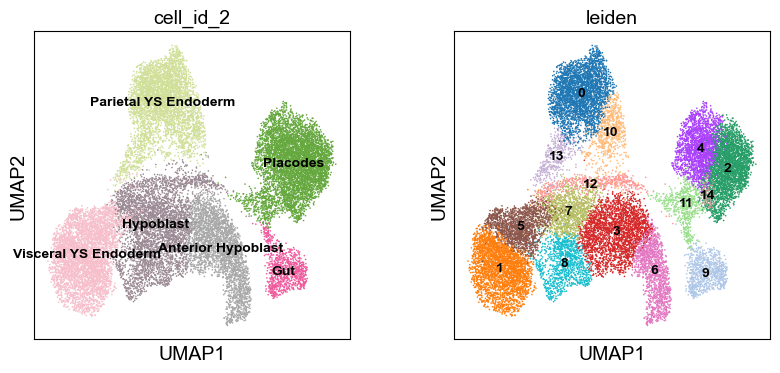

In [59]:
sc.pl.umap(adata_endoderm,color=['cell_id_2','leiden'], legend_loc='on data', legend_fontsize='10')

C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


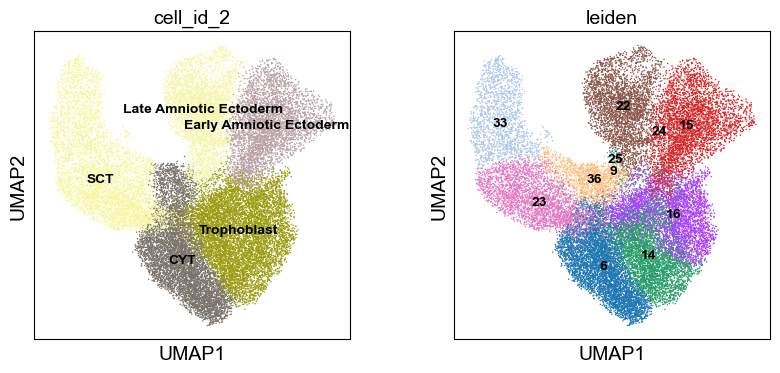

In [133]:
sc.pl.umap(adata_ectoderm,color=['cell_id_2','leiden'], legend_loc='on data', legend_fontsize='10')

In [70]:
sc.tl.dendrogram(adata_endoderm, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


In [73]:
sc.tl.dpt(adata_endoderm)

    adata.uns['iroot'] = root_cell_index
    adata.var['xroot'] = adata[root_cell_name, :].X
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99878323 0.9966881  0.99519247 0.994868   0.9876457
     0.97843295 0.9700497  0.9613729  0.95462537 0.9533452  0.9471323
     0.9463294  0.94568557 0.94306153]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
 (0:00:00)


In [95]:
sc.tl.paga(adata_endoderm, groups='leiden')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


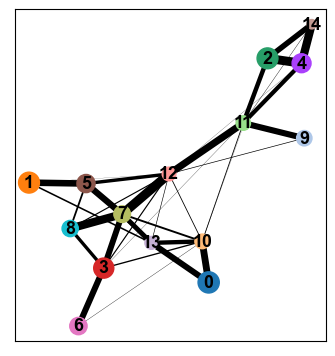

In [100]:
sc.pl.paga(adata_endoderm)

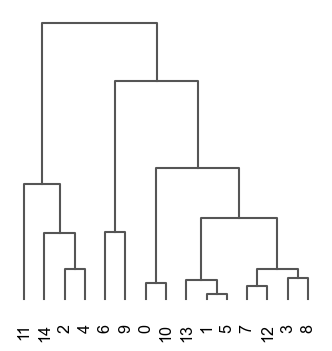

<AxesSubplot:>

In [77]:
sc.pl.dendrogram(adata_endoderm, groupby='leiden')

In [97]:
adata_endoderm

AnnData object with n_obs × n_vars = 22064 × 30725
    obs: 'sample', 'stage', 'batch', 'doub.density', 'doublet', 'cluster', 'clustersub', 'clusterstage', 'stripped', 'clusterIdx', 'clustercat', 'clusterSubUnique', 'tsne1', 'tsne2', 'stage_res', 'ann_clusters', 'leiden', 'leiden_5', 'leiden_2', 'leiden_1', 'leiden_3', 'cell_id', 'cell_id_2', 'leiden_6', 'cell_id_l6', 'cell_id_6', 'cell_id_l6_test'
    var: 'geneID', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'ann_clusters_sizes', 'leiden', 'leiden_2_sizes', 'neighbors', 'paga', 'rank_genes_groups', 'umap', 'dendrogram_leiden', 'diffmap_evals', 'leiden_sizes', 'leiden_colors'
    obsm: 'X_haem', 'X_neural', 'X_pca', 'X_tsne', 'X_umap', 'X_diffmap'
    obsp: 'connectivities', 'distances'

In [98]:
del adata_endoderm.uns['leiden_colors']

In [ ]:
#need to rename ensemble genes

ranking genes
C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:51)


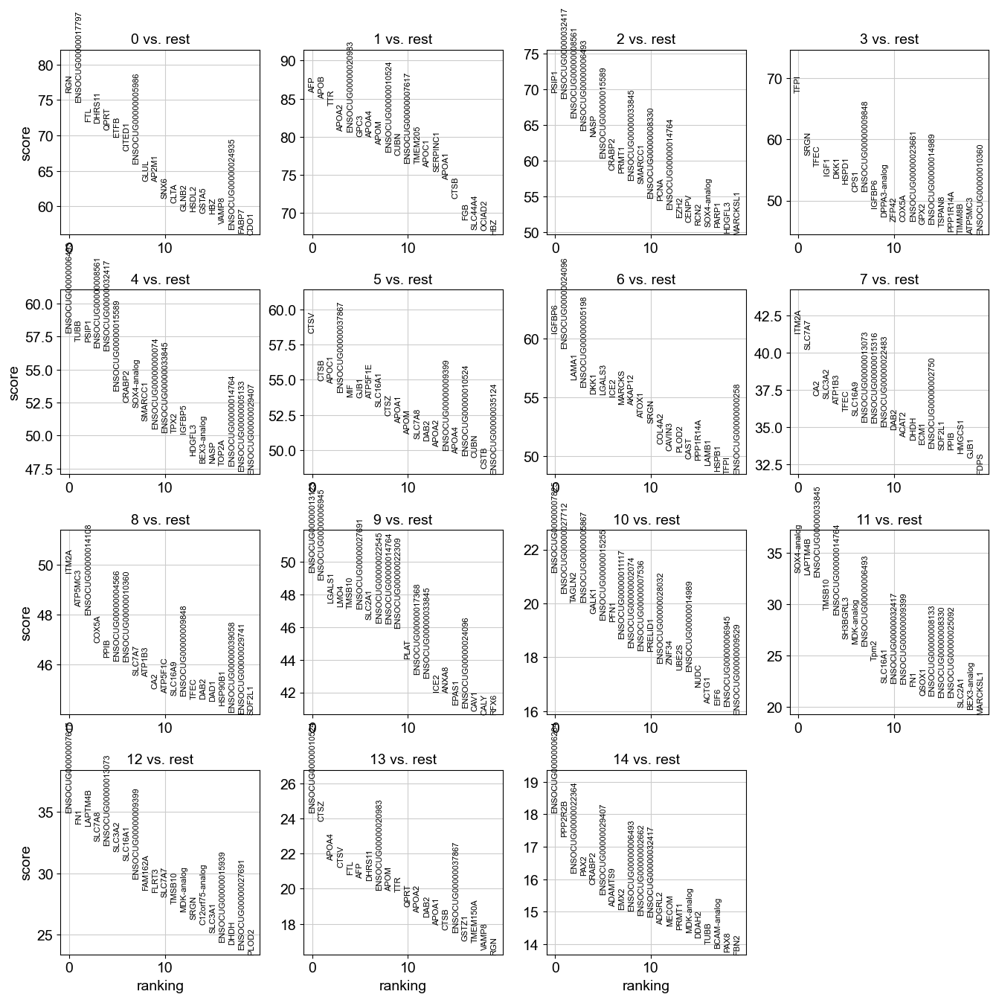

In [64]:
sc.tl.rank_genes_groups(adata_endoderm, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_endoderm, n_genes=20, sharey=False)

In [63]:
# Look at the top 5 genes per cluster
pd.DataFrame(adata_endoderm.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,RGN,AFP,PSIP1,TFPI,ENSOCUG00000006493,CTSV,IGFBP6,ITM2A,ITM2A,ENSOCUG00000013123,ENSOCUG00000007825,SOX4-analog,ENSOCUG00000007617,ENSOCUG00000010524,ENSOCUG00000006264
1,ENSOCUG00000017797,APOB,ENSOCUG00000032417,SRGN,TUBB,CTSB,ENSOCUG00000024096,SLC7A7,ATP5MC3,ENSOCUG00000006945,ENSOCUG00000027712,LAPTM4B,FN1,CTSZ,PPP2R2B
2,FTL,TTR,ENSOCUG00000008561,TFEC,PSIP1,APOC1,LAMA1,CA2,ENSOCUG00000014108,LGALS1,TAGLN2,ENSOCUG00000033845,LAPTM4B,APOA4,ENSOCUG00000022364
3,DHRS11,APOA2,ENSOCUG00000006493,IGF1,ENSOCUG00000008561,ENSOCUG00000037867,ENSOCUG00000005198,SLC3A2,COX5A,LMO4,ENSOCUG00000005867,TMSB10,SLC7A8,CTSV,PAX2
4,QPRT,ENSOCUG00000020983,NASP,DKK1,ENSOCUG00000032417,MIF,DKK1,ATP1B3,PPIB,TMSB10,GALK1,ENSOCUG00000014764,ENSOCUG00000013073,FTL,CRABP2
5,ETFB,GPC3,ENSOCUG00000015589,HSPD1,ENSOCUG00000015589,GJB1,LGALS3,TFEC,ENSOCUG00000004566,ENSOCUG00000027691,ENSOCUG00000015255,SH3BGRL3,SLC3A2,AFP,ENSOCUG00000029407
6,CITED1,APOA4,CRABP2,CPS1,CRABP2,ATP5F1E,ICE2,SLC16A9,ENSOCUG00000010360,SLC2A1,PFN1,MDK-analog,SLC16A1,DHRS11,ADAMTS9
7,ENSOCUG00000005986,APOM,PRMT1,ENSOCUG00000009848,SOX4-analog,SLC16A1,MARCKS,ENSOCUG00000013073,SLC7A7,ENSOCUG00000022545,ENSOCUG00000011117,ENSOCUG00000006493,ENSOCUG00000009399,ENSOCUG00000020983,EMX2
8,GLUL,ENSOCUG00000010524,ENSOCUG00000033845,IGFBP6,SMARCC1,CTSZ,AKAP12,ENSOCUG00000015316,ATP1B3,ENSOCUG00000014764,ENSOCUG00000002074,Tpm2,FAM162A,APOM,ENSOCUG00000006493
9,AP2M1,CUBN,SMARCC1,DPPA3-analog,ENSOCUG00000000074,APOA1,ATOX1,ENSOCUG00000022483,CA2,ENSOCUG00000022309,ENSOCUG00000007536,SLC16A1,FLRT3,TTR,ENSOCUG00000002662


In [101]:
#sc.tl.score_genes_cell_cycle(adata_endoderm)

TypeError: score_genes_cell_cycle() missing 2 required positional arguments: 's_genes' and 'g2m_genes'

In [ ]:
adata_endoderm.var_names_make_unique()

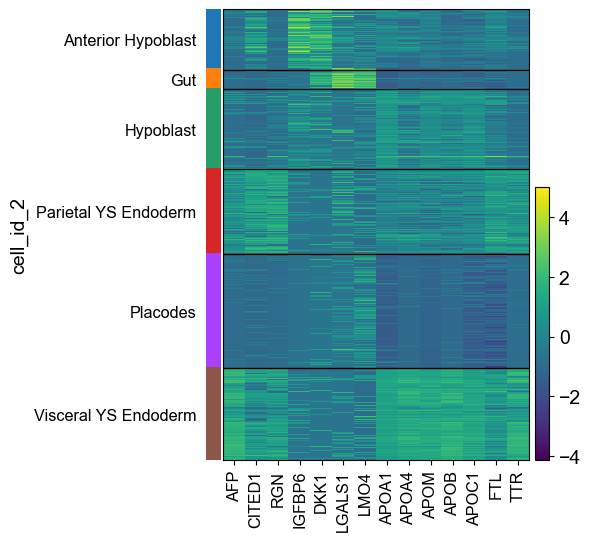

In [114]:
sc.pl.heatmap(adata_endoderm, var_names=['AFP','CITED1','RGN','IGFBP6','DKK1','LGALS1','LMO4','APOA1','APOA4','APOM','APOB','APOC1','FTL','TTR'],groupby='cell_id_2')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_id_2']`


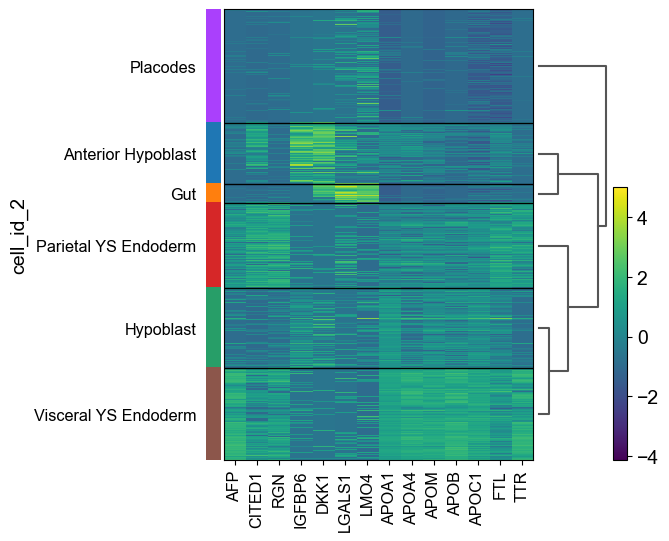

In [128]:
sc.pl.heatmap(adata_endoderm, var_names=['AFP','CITED1','RGN','IGFBP6','DKK1','LGALS1','LMO4','APOA1','APOA4','APOM','APOB','APOC1','FTL','TTR'],groupby='cell_id_2', dendrogram=True)

ranking genes
C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:01)


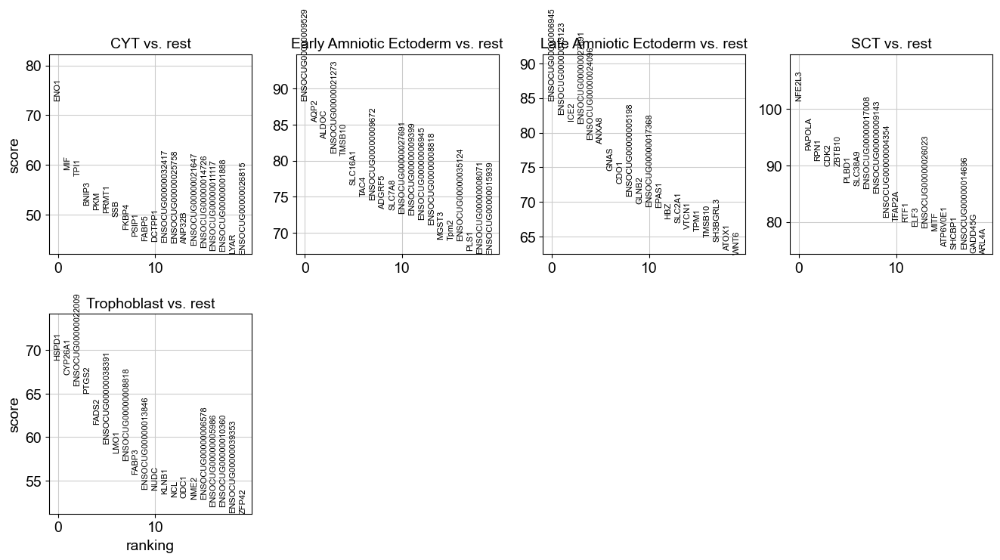

In [116]:
sc.tl.rank_genes_groups(adata_ectoderm, 'cell_id_2', method='wilcoxon')
sc.pl.rank_genes_groups(adata_ectoderm, n_genes=20, sharey=False)



In [117]:
# Look at the top 5 genes per cluster
pd.DataFrame(adata_ectoderm.uns['rank_genes_groups']['names']).head(20)

,CYT,Early Amniotic Ectoderm,Late Amniotic Ectoderm,SCT,Trophoblast
0,ENO1,ENSOCUG00000009529,ENSOCUG00000006945,NFE2L3,HSPD1
1,MIF,AQP2,ENSOCUG00000013123,PAPOLA,CYP26A1
2,TPI1,ALDOC,ICE2,RPN1,ENSOCUG00000022009
3,BNIP3,ENSOCUG00000021273,ENSOCUG00000027691,CDK2,PTGS2
4,PKM,TMSB10,ENSOCUG00000024096,ZBTB10,FADS2
5,PRMT1,SLC16A1,ANXA8,PLBD1,ENSOCUG00000038391
6,SSB,TAC4,GNAS,SLC38A9,LMO1
7,FKBP4,ENSOCUG00000009672,CDO1,ENSOCUG00000017008,ENSOCUG00000008818
8,PSIP1,ADGRF5,ENSOCUG00000005198,ENSOCUG00000009143,FABP3
9,FABP5,SLC7A8,GLNB2,ENSOCUG00000004354,ENSOCUG00000013846


In [119]:
adata_ectoderm.var_names_make_unique()

In [129]:
sc.tl.dendrogram(adata_ectoderm, groupby='cell_id_2')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_id_2']`


C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


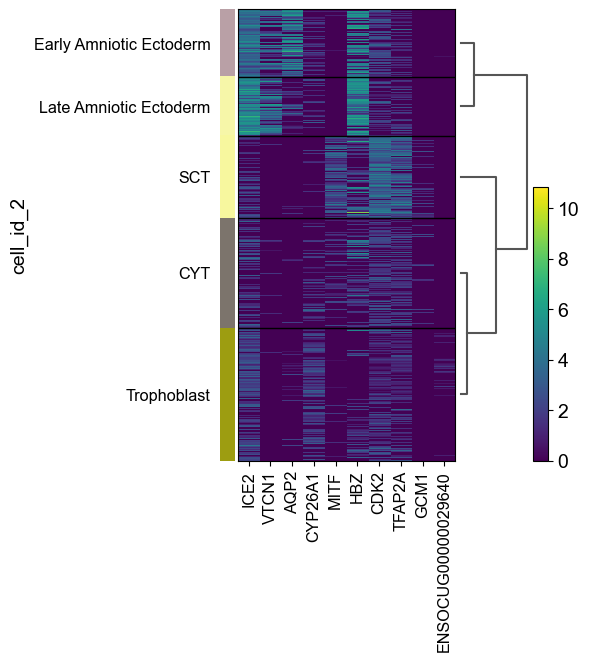

In [130]:
sc.pl.heatmap(adata_ectoderm, var_names=['ICE2','VTCN1','AQP2','CYP26A1','MITF','HBZ','CDK2','TFAP2A','GCM1','ENSOCUG00000029640'],groupby='cell_id_2',dendrogram=True)

In [134]:
adata_pgcnotoepi = adata[adata.obs.cell_id_2.isin(['Notochord','Epiblast'])]

C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [149]:
#create SNN graph
sc.pp.neighbors(adata_pgcnotoepi, n_neighbors=20, n_pcs=50)
 
#run UMAP
sc.tl.umap(adata_pgcnotoepi, min_dist=0.8)
#create SNN graph
#sc.pp.neighbors(adata_ectoderm, n_neighbors=20, n_pcs=50)
 
#run UMAP
#sc.tl.umap(adata_ectoderm, min_dist=0.8)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [151]:
sc.tl.leiden(adata_pgcnotoepi, resolution=0.8)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


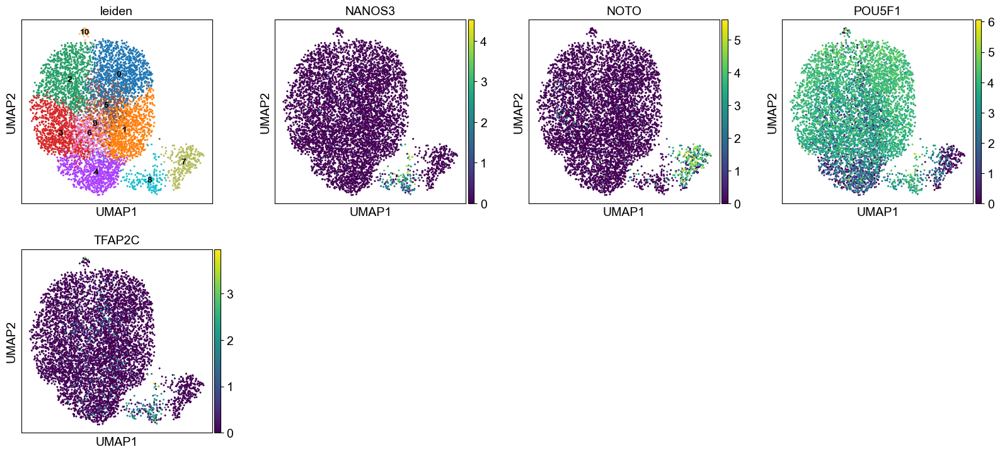

In [152]:
# what's cluster 10?
sc.pl.umap(adata_pgcnotoepi,color=['leiden','NANOS3','NOTO','POU5F1','TFAP2C'], legend_loc='on data', legend_fontsize='10')

C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


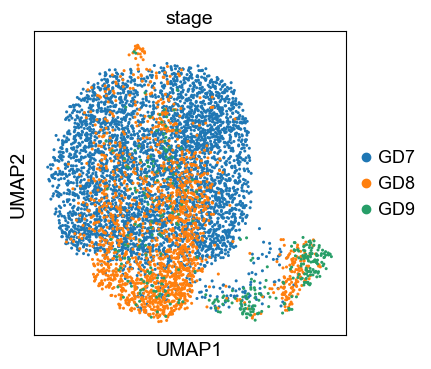

In [155]:
sc.pl.umap(adata_pgcnotoepi, color='stage')

ranking genes
C:\Users\Mai-Linh Ton\AppData\Roaming\Python\Python38\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


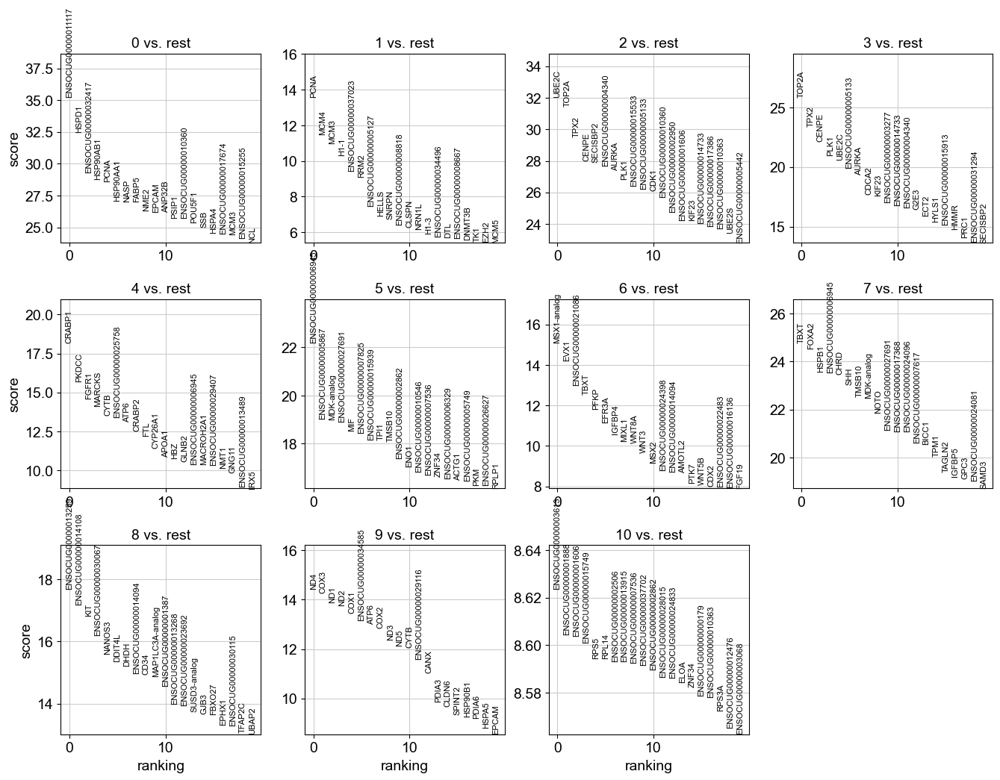

,0,1,2,3,4,5,6,7,8,9,10
0,ENSOCUG00000011117,PCNA,UBE2C,TOP2A,CRABP1,ENSOCUG00000006945,MSX1-analog,TBXT,ENSOCUG00000013259,ND4,ENSOCUG00000003613
1,HSPD1,MCM4,TOP2A,TPX2,PKDCC,ENSOCUG00000005867,EVX1,FOXA2,ENSOCUG00000014108,COX3,ENSOCUG00000001888
2,ENSOCUG00000032417,MCM3,TPX2,CENPE,FGFR1,MDK-analog,ENSOCUG00000021086,HSPB1,KIT,ND1,ENSOCUG00000001606
3,HSP90AB1,H1-1,CENPE,PLK1,MARCKS,ENSOCUG00000027691,TBXT,ENSOCUG00000006945,ENSOCUG00000030067,ND2,ENSOCUG00000015749
4,PCNA,ENSOCUG00000037023,SECISBP2,UBE2C,CYTB,MIF,PFKP,CHRD,NANOS3,COX1,RPS5
5,HSP90AA1,RRM2,ENSOCUG00000004340,ENSOCUG00000005133,ENSOCUG00000025758,ENSOCUG00000007825,EFR3A,SHH,DDIT4L,ENSOCUG00000034585,RPL14
6,NASP,ENSOCUG00000005127,AURKA,AURKA,ATP6,ENSOCUG00000015939,IGFBP4,TMSB10,DHDH,ATP6,ENSOCUG00000002506
7,FABP5,HELLS,PLK1,CDCA2,CRABP2,TPI1,MIXL1,MDK-analog,ENSOCUG00000014094,COX2,ENSOCUG00000013915
8,NME2,SNRPN,ENSOCUG00000015533,KIF23,FTL,TMSB10,WNT8A,NOTO,CD34,ND3,ENSOCUG00000007536
9,EPCAM,ENSOCUG00000008818,ENSOCUG00000005133,ENSOCUG00000003277,CYP26A1,ENSOCUG00000002862,WNT3,ENSOCUG00000027691,MAP1LC3A-analog,ND5,ENSOCUG00000037702


In [154]:
sc.tl.rank_genes_groups(adata_pgcnotoepi, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_pgcnotoepi, n_genes=20, sharey=False)

# Look at the top 5 genes per cluster
pd.DataFrame(adata_pgcnotoepi.uns['rank_genes_groups']['names']).head(20)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:39)
--> added 'pos', the PAGA positions (adata.uns['paga'])


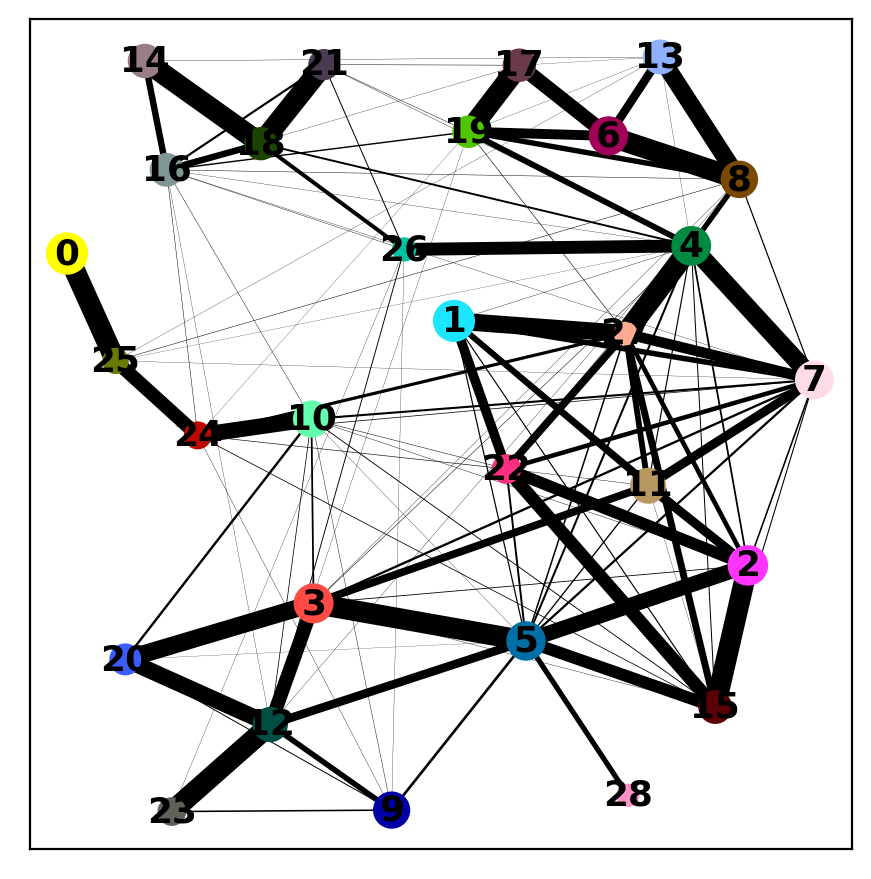

In [109]:
sc.tl.paga(adata, groups = "leiden_2")
sc.pl.paga(adata, color="leiden_2", pos="/rds/project/bg200/rds-bg200-hphi-gottgens/users/mlnt2/PhD_MT06/write/leidenmod.gdf")

In [ ]:
## discover if there is a second wave of haematopoesis in the cluster originally labeled as megakaryocytes

In [8]:
adata.obs

,sample,stage,batch,doub.density,doublet,cluster,clustersub,clusterstage,stripped,clusterIdx,...,tsne2,stage_res,ann_clusters,leiden,leiden_5,leiden_2,leiden_1,leiden_3,cell_id,cell_id_2
index,,,,,,,,,,,,,,,,,,,,,
cell_1,1,GD7,1,6.367198,False,4.0,1.0,8.0,False,3.0,...,16.276639,GD7,4,4,22,7,6,7,Epiblast,Epiblast
cell_2,1,GD7,1,0.000000,False,2.0,1.0,13.0,False,1.0,...,-19.865110,GD7,2,17,2,14,8,17,Visceral YS Endoderm,Visceral YS Endoderm
cell_4,1,GD7,1,43.049333,False,4.0,3.0,3.0,False,3.0,...,11.410026,GD7,4,4,18,7,6,7,Epiblast,Epiblast
cell_5,1,GD7,1,8.402787,False,10.0,2.0,15.0,False,9.0,...,-2.360212,GD7,10,14,14,6,1,2,Trophoblast,Trophoblast
cell_6,1,GD7,1,61.325550,False,4.0,2.0,9.0,False,3.0,...,15.951718,GD7,4,32,43,7,6,29,Epiblast,Primitive Streak
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_172991,26,GD9,1,1.844210,False,13.0,7.0,19.0,False,12.0,...,-10.922396,GD9_YS,13,10,1,0,4,1,Late Erythrocytes,Late Erythrocytes
cell_172992,26,GD9,1,6.678890,False,16.0,9.0,2.0,False,15.0,...,-7.500678,GD9_YS,16,31,36,24,9,28,Megakaryocytes,Haematoendothelial progenitors
cell_172993,26,GD9,1,2.266589,False,13.0,1.0,19.0,False,12.0,...,-11.060558,GD9_YS,13,10,1,0,4,1,Late Erythrocytes,Late Erythrocytes


In [9]:
adata_haemwave = adata[adata.obs['cell_id_2'].isin(['Megakaryocytes', 'Haematoendothelial progenitors'])].copy()


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... storing 'cell_id' as categorical
... storing 'cell_id_2' as categorical


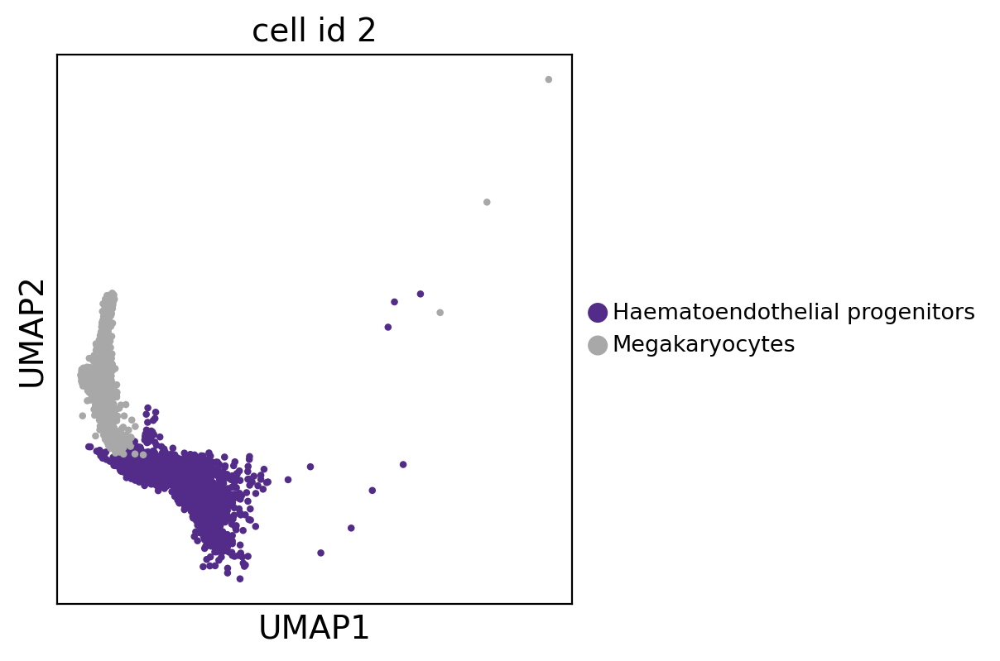

In [10]:
sc.pl.scatter(adata_haemwave,color='cell_id_2',legend_loc='right margin',legend_fontweight='normal',legend_fontsize='x-small',basis="umap", palette=colPalette)

In [14]:
sc.tl.pca(adata_haemwave)

In [16]:
sc.pp.neighbors(adata_haemwave)
sc.tl.umap(adata_haemwave)

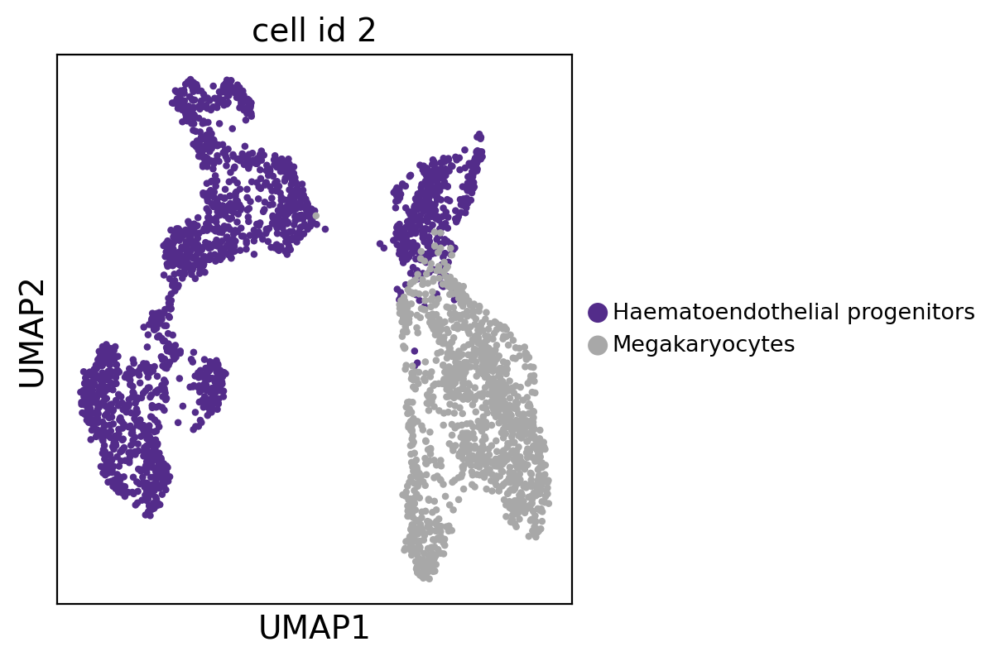

In [17]:
sc.pl.scatter(adata_haemwave,color='cell_id_2',legend_loc='right margin',legend_fontweight='normal',legend_fontsize='x-small',basis="umap", palette=colPalette)

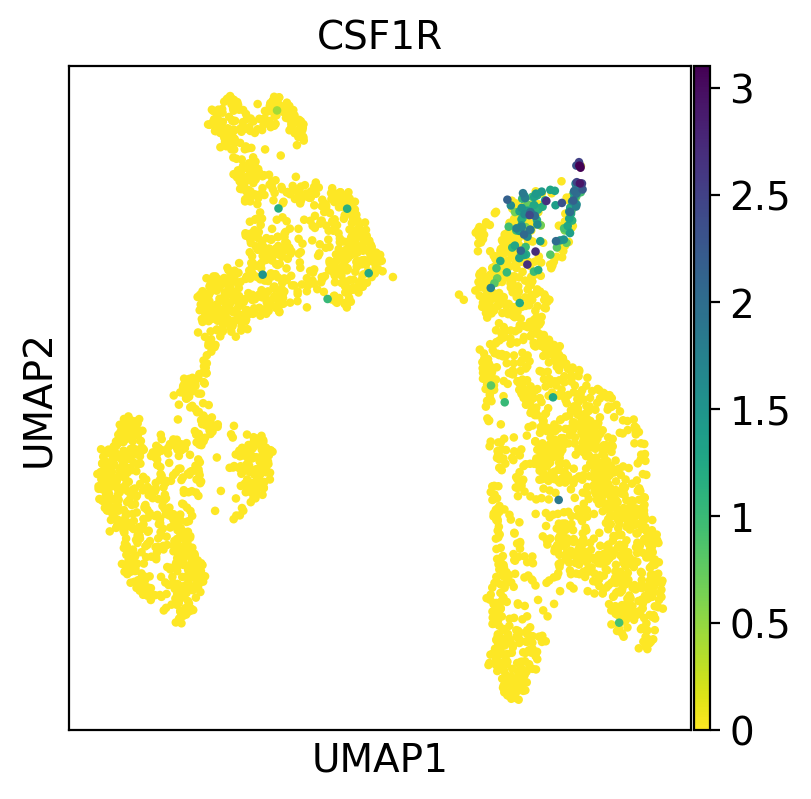

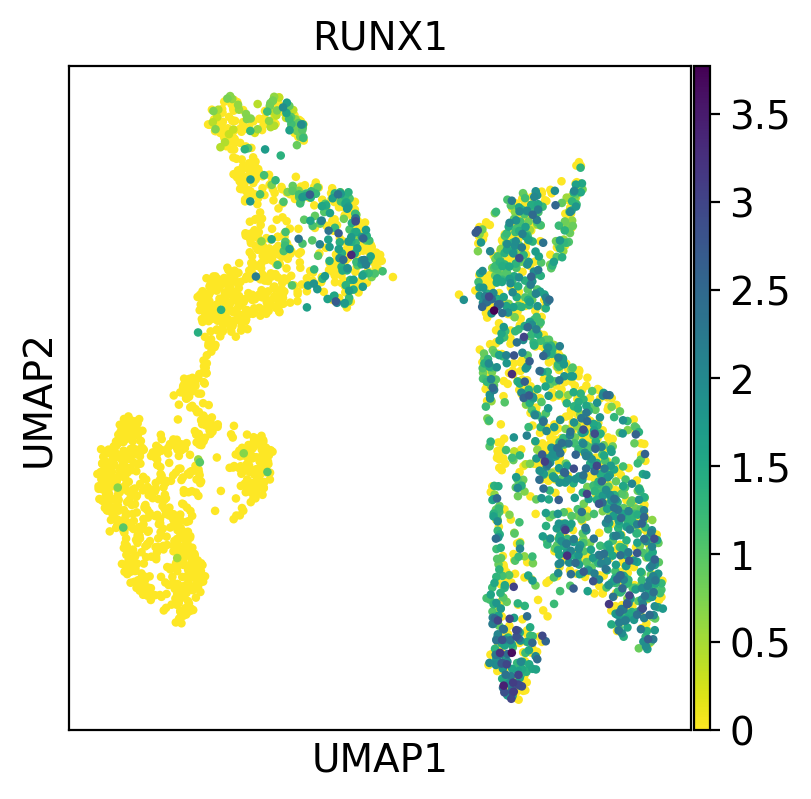

In [18]:
adata_haemwave.obs["CSF1R"]=adata_haemwave.X[:,adata_haemwave.var.index=='CSF1R'].sum(1)
sc.pl.scatter(adata_haemwave,color='CSF1R',color_map="viridis_r",legend_loc='none',basis="umap",sort_order=True)
adata_haemwave.obs["RUNX1"]=adata_haemwave.X[:,adata_haemwave.var.index=='RUNX1'].sum(1)
sc.pl.scatter(adata_haemwave,color='RUNX1',color_map="viridis_r",legend_loc='none',basis="umap",sort_order=True)

In [2]:
adata_endo = sc.read("/rds/project/bg200/rds-bg200-hphi-gottgens/users/mlnt2/PhD_MT06/10_trajectory/adataendoderm_15102020.h5ad")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


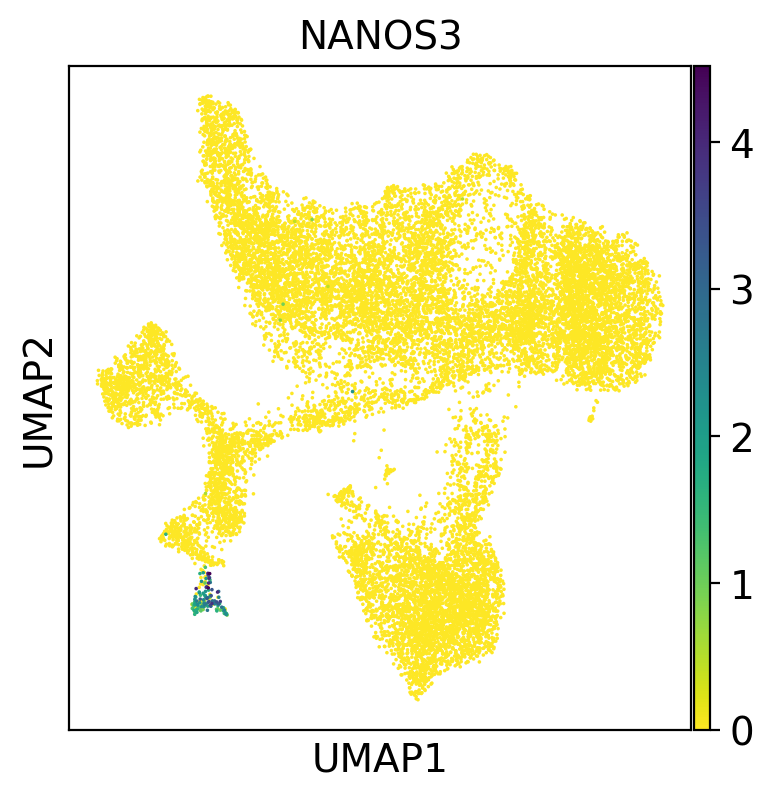

In [4]:
adata_endo.obs["NANOS3"]=adata_endo.X[:,adata_endo.var.index=='NANOS3'].sum(1)
sc.pl.scatter(adata_endo,color='NANOS3',color_map="viridis_r",legend_loc='none',basis="umap")

running Leiden clustering
    finished: found 40 clusters and added
    'lei_endo_3', the cluster labels (adata.obs, categorical) (0:00:10)


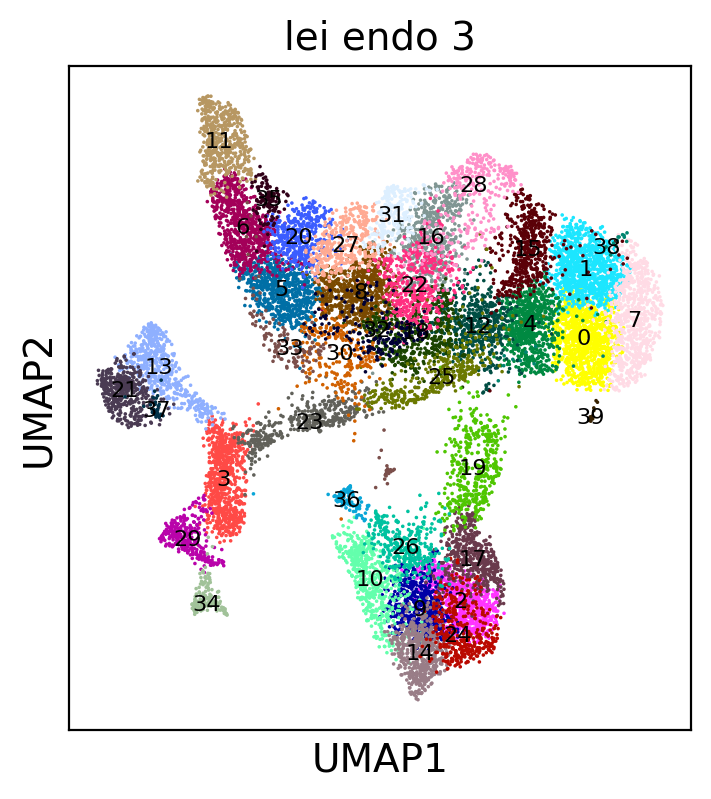

In [10]:
#subcluster the endoderm to separate out the PGCs then run DE gene analysis on this subset
sc.tl.leiden(adata_endo, resolution=3, key_added='lei_endo_3') # res 1 yields 21  clusters
sc.pl.scatter(adata_endo,color='lei_endo_3',legend_loc='on data',legend_fontweight='normal',legend_fontsize='xx-small',basis="umap")


extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


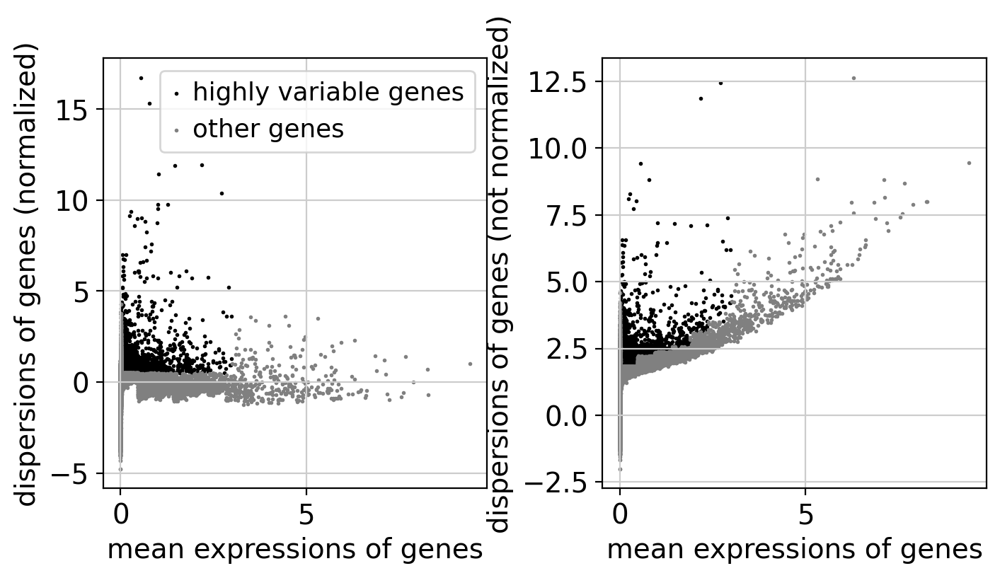

Number of HVGs: 2784
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:22)


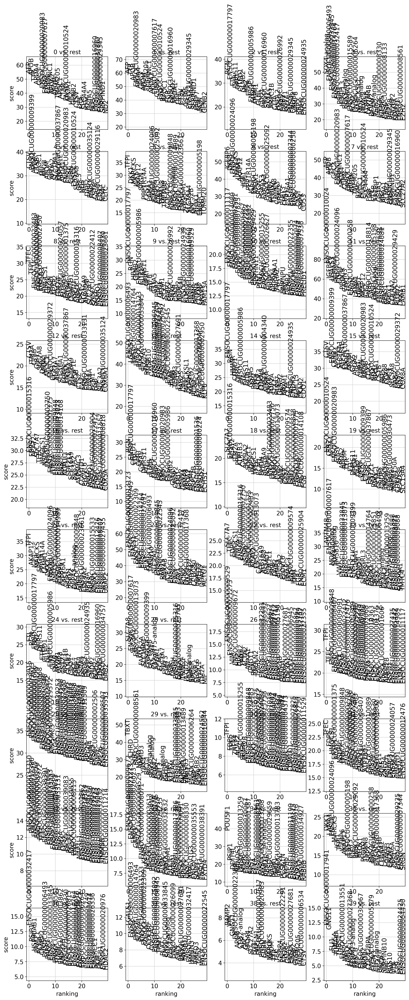

In [12]:
sc.pp.highly_variable_genes(adata_endo, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pl.highly_variable_genes(adata_endo)
print('Number of HVGs: '+ str(sum(adata.var['highly_variable'])))

sc.tl.rank_genes_groups(adata_endo, 'lei_endo_3')

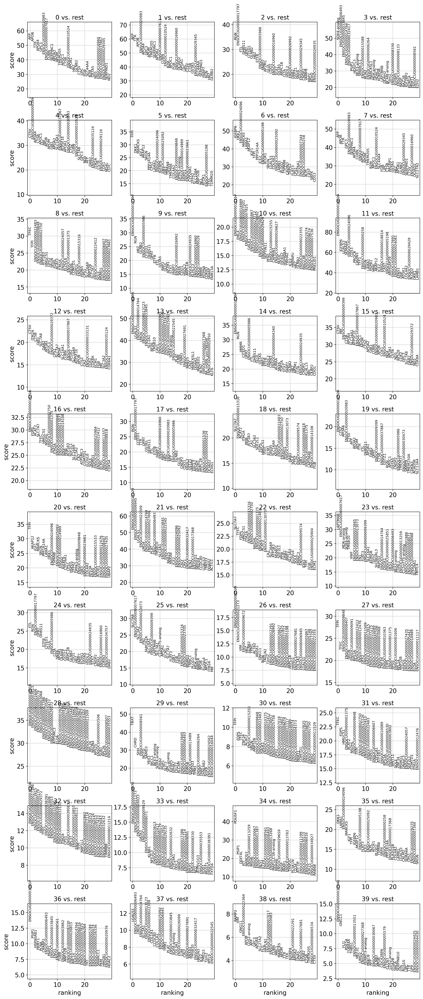

In [13]:
sc.pl.rank_genes_groups(adata_endo, n_genes=30, sharey=False, fontsize=8)

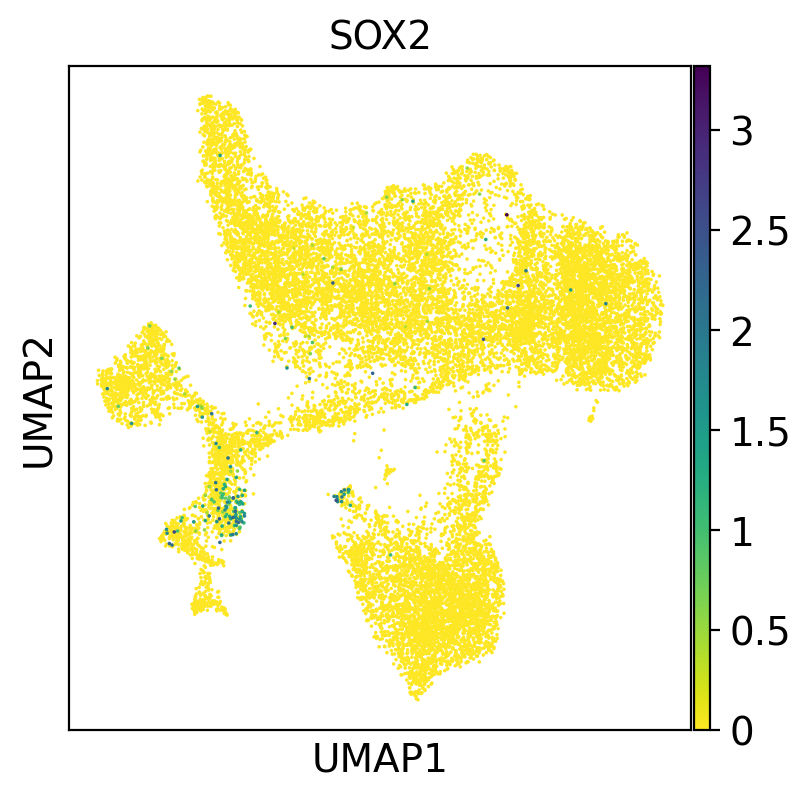

In [15]:
adata_endo.obs["SOX2"]=adata_endo.X[:,adata_endo.var.index=='ENSOCUG00000011135'].sum(1)
sc.pl.scatter(adata_endo,color='SOX2',color_map="viridis_r",legend_loc='none',basis="umap")

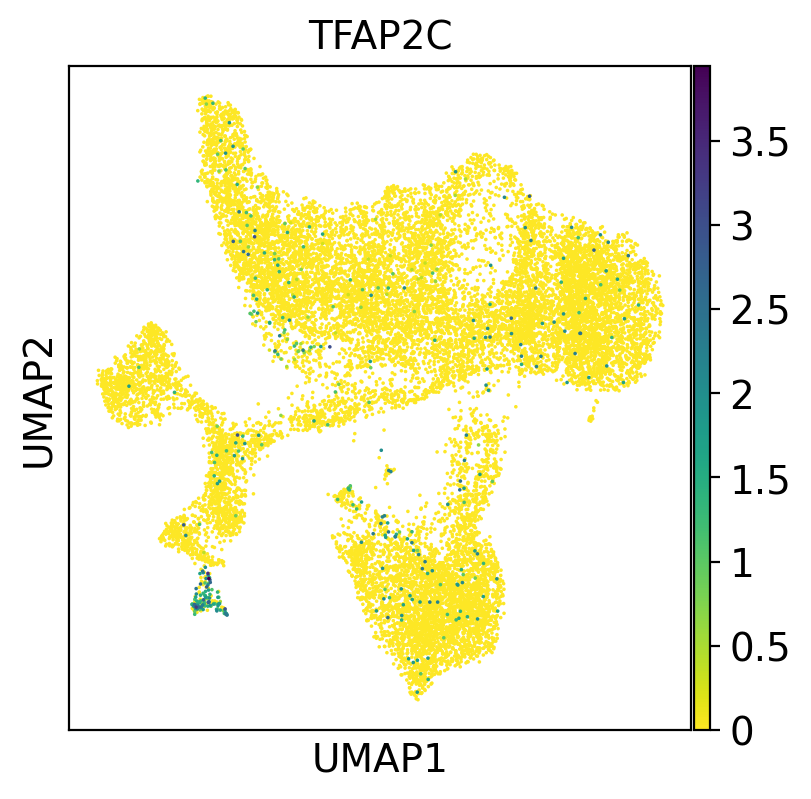

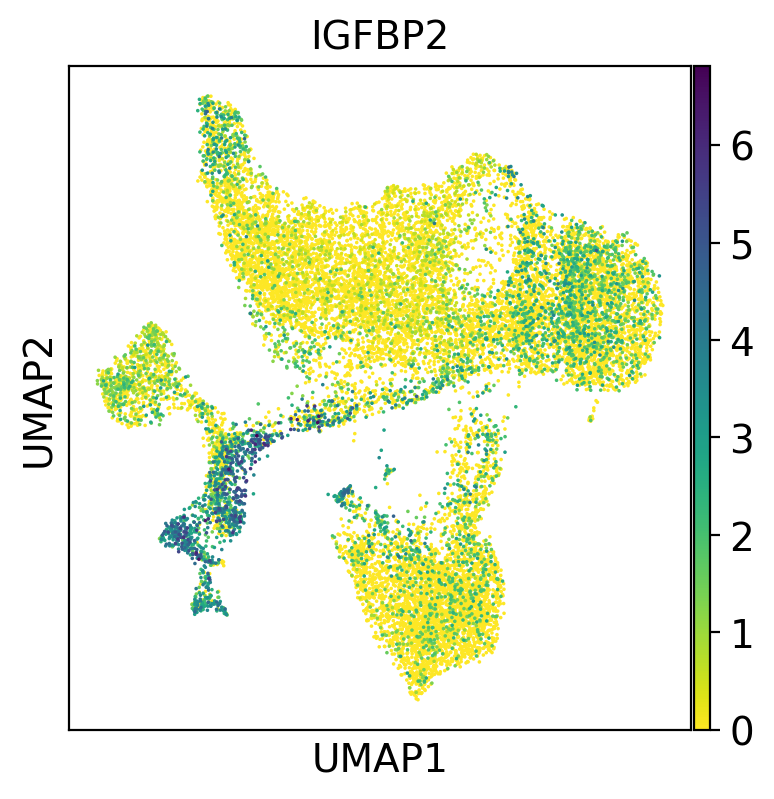

In [18]:
adata_endo.obs["TFAP2C"]=adata_endo.X[:,adata_endo.var.index=='TFAP2C'].sum(1)
sc.pl.scatter(adata_endo,color='TFAP2C',color_map="viridis_r",legend_loc='none',basis="umap")

adata_endo.obs["IGFBP2"]=adata_endo.X[:,adata_endo.var.index=='ENSOCUG00000008561'].sum(1)
sc.pl.scatter(adata_endo,color='IGFBP2',color_map="viridis_r",legend_loc='none',basis="umap")